### NAME : DEEPAK AV
    
### Linear regression

### Problem 1:compactiv.xlsx

## We will construct a linear model that can predict a car's mileage (usr) by using its other attributes.


### Import Libraries

In [1]:
# Importing all the libraries for linear regression.
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error


### Load and explore the data

In [2]:
import os

In [3]:
os.getcwd()

'C:\\Users\\deepak\\Downloads'

In [4]:
# Loading the data to the python project. 
df=pd.read_excel('compactiv.xlsx')

In [5]:
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,NaN,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,NaN,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,NaN,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


# 1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.


In [6]:
# let's check the first 5 rows of the data.
df.head()


,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [7]:
# let's check the last 5 rows of the data.
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [8]:
# let's check column types and number of values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [9]:
# let's check the shape of the data
df.shape

(8192, 22)

In [10]:
# Analysing the 5 point summary of the data.
df.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.088000e+03,8.177000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8192.000000
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,11.919712,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.398375e+05,1.408417e+05,5.307038,...,32.363520,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.409150e+04,2.291600e+04,0.000000,...,0.000000,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.254735e+05,4.661900e+04,0.000000,...,0.000000,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.678288e+05,1.061010e+05,2.400000,...,5.000000,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,2002.250000,1.730380e+06,94.000000
max,1845.000000,575.000000,12493.000000,5318.000000,5456.000000,20.120000,59.560000,2.526649e+06,1.801623e+06,81.440000,...,523.000000,1237.000000,211.580000,141.200000,292.610000,899.800000,1365.000000,12027.000000,2.243187e+06,99.000000


In [11]:
# Analysing the null values. 
df.isnull()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8188,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8189,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8190,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [12]:
# Calculating the null values present in each column of the data.
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [13]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

### UNIVARIATE ANALYSIS

<AxesSubplot:>

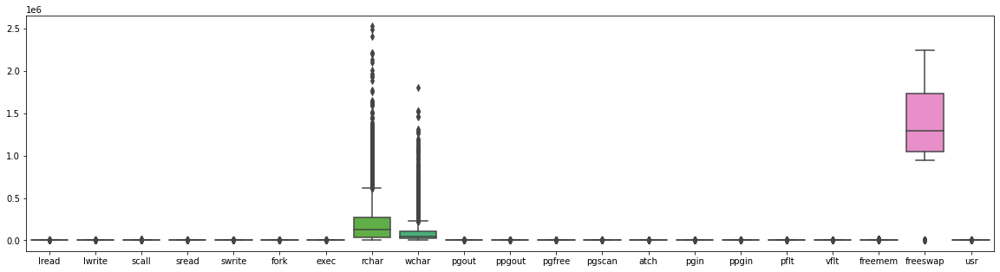

In [14]:
# Analysing the data with the method of univariate analysis with the boxplot.
plt.figure(figsize=(20,5))
sns.boxplot(data=df)

### BIVARIATE ANALYSIS

<AxesSubplot:>

C:\Users\deepak\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


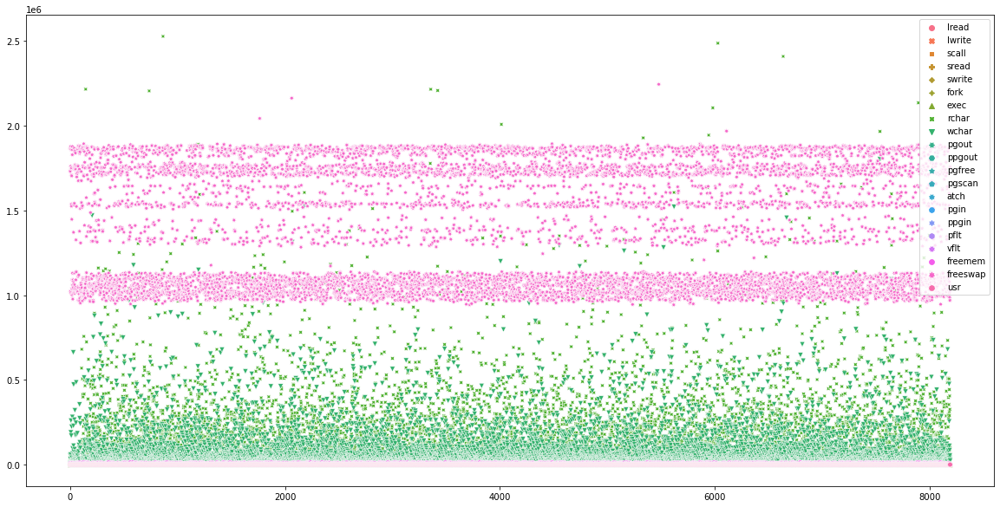

In [15]:
# Analysing the data with the method of bivariate analysis with the scatterplot.
plt.figure(figsize=(20,10))
sns.scatterplot(data=df)

### MULTIVARIATE ANALYSIS

C:\Users\deepak\anaconda3\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


<Figure size 720x360 with 0 Axes>

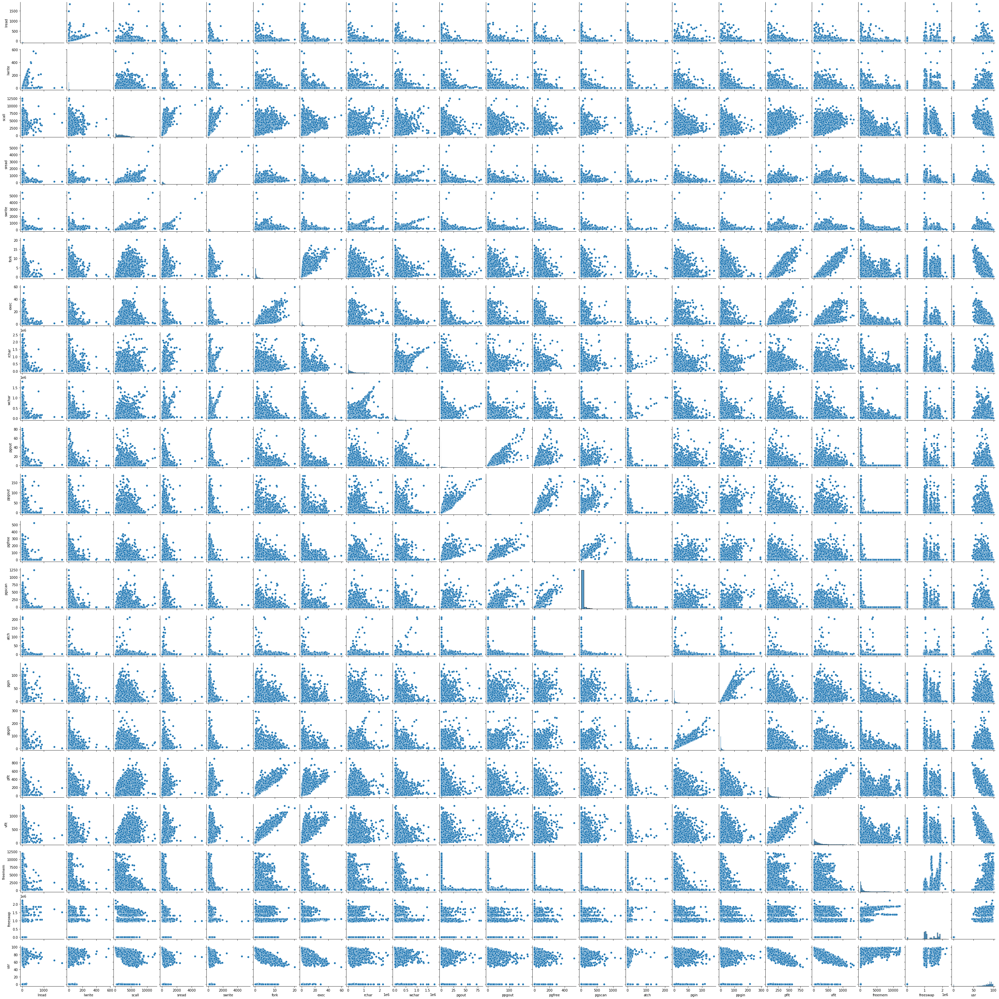

In [16]:
# Analysing the data with the method of multivariate analysis with the pairplot.
plt.figure(figsize=(10,5))
sns.pairplot(data=df,size=2) 

# 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

In [17]:
# Calculating the null values present in each column of the data.
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

#### Inference : There are 104 null values present in 'rchar' and 15 null values present in 'wchar' features in the dataset.

In [18]:
# Imputing the null values present in the data with median.
df['rchar'].fillna(df['rchar'].median(), inplace = True)

#### Inference : Imputing the null values present in 'rchar' with median.

In [19]:
# Imputing the null values present in the data with median.
df['wchar'].fillna(df['wchar'].median(), inplace = True)

#### Inference : Imputing the null values present in 'wchar' with median.

In [20]:
# After imputing checking the null values in the data.
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [21]:
# Analysing the data wheather it contains zero values or not ?
(df == 0).sum()

lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz         0
freemem        0
freeswap       0
usr          283
dtype: int64

In [22]:
(df == 0).sum().sum()

31775

#### Inference : There are 31,775 zero values present in the datset.

In [23]:
#Printing tha zero values present in the data.
df.loc[~(df==0).all(axis=1)]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


In [24]:
# Dropping the categorical feature present in the data.
df=df.drop(["runqsz"], axis=1)

#### Inference : Dropping the categorical value to treat the outliers.

<AxesSubplot:>

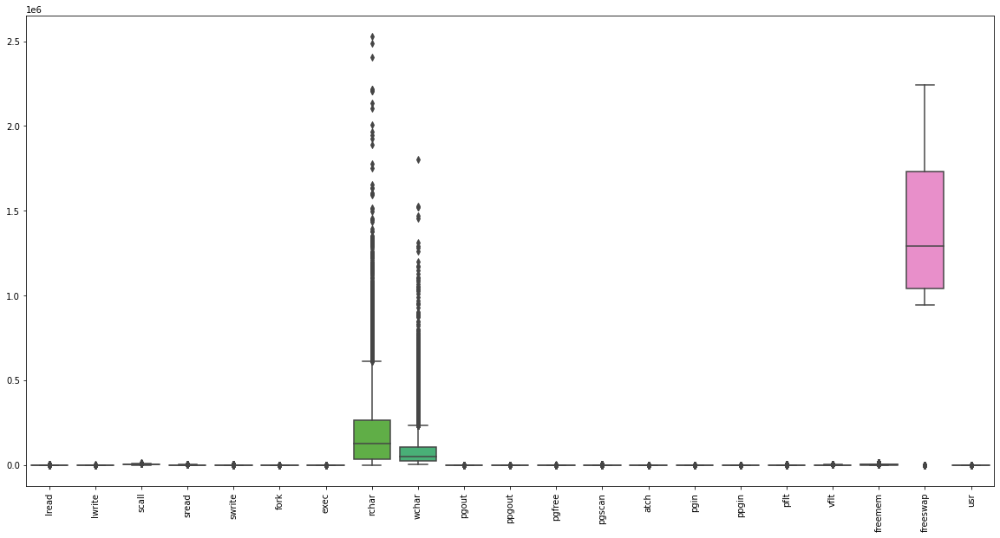

In [25]:
# Checking the outliers through boxplot.
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [26]:
# Removing the outliers using interquartile range.
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range 

In [27]:
# Treating the outliers
for i in df.columns:
    LL, UL = remove_outlier(df[i])
    df[i] = np.where(df[i] > UL, UL, df[i])
    df[i] = np.where(df[i] < LL, LL, df[i])

<AxesSubplot:>

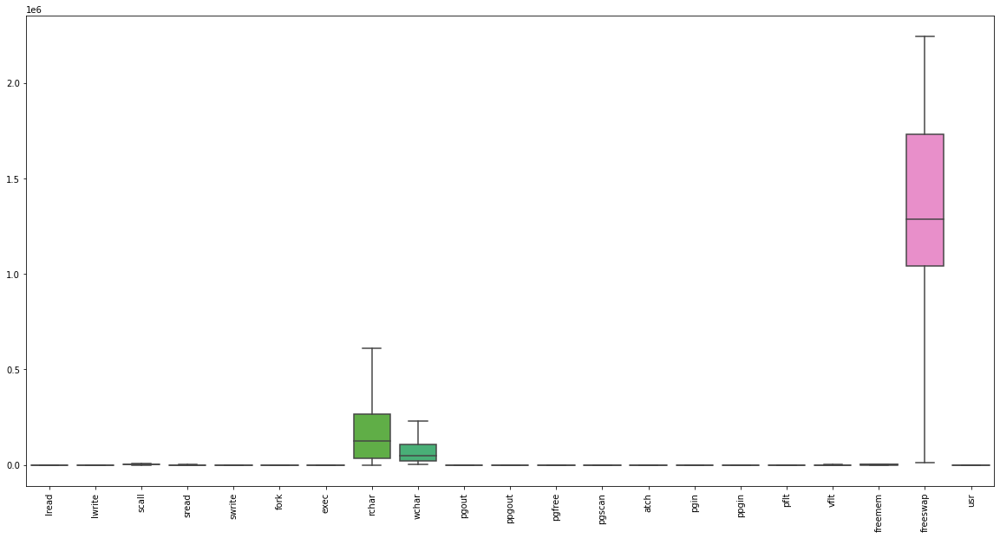

In [28]:
# Plotting a boxplot to chech the outliers is removed or not?
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [29]:
#### Inference :

In [30]:
# Checking for the duplicate values present in the dataset.
df.duplicated().sum()

0

In [31]:
#### Inference :

In [32]:
# Dropping the 'pgscan' feature in the datset.
df=df.drop(["pgscan"], axis=1)

# 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

In [33]:
df_corr = df.corr()
df_corr

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,ppgout,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
lread,1.000000,0.834674,0.333572,0.326032,0.306542,0.365676,0.364062,0.255544,0.174410,0.208258,0.219798,0.214400,0.230628,0.283252,0.290564,0.375250,0.421079,-0.201369,-0.243903,-0.438163
lwrite,0.834674,1.000000,0.140213,0.148028,0.132097,0.093166,0.121778,0.117504,0.132595,0.090726,0.089149,0.082519,0.126769,0.113368,0.118388,0.102631,0.135243,-0.099558,-0.149630,-0.185695
scall,0.333572,0.140213,1.000000,0.763001,0.742206,0.474491,0.440010,0.386875,0.331933,0.297487,0.305507,0.300612,0.306359,0.335380,0.325487,0.485361,0.548081,-0.388969,-0.357864,-0.618932
sread,0.326032,0.148028,0.763001,1.000000,0.876652,0.528047,0.369723,0.576127,0.415059,0.301658,0.315648,0.311863,0.292044,0.346654,0.344586,0.529364,0.597892,-0.349887,-0.369897,-0.638072
swrite,0.306542,0.132097,0.742206,0.876652,1.000000,0.519148,0.313323,0.419759,0.430126,0.274708,0.284982,0.280082,0.264283,0.307420,0.302481,0.505560,0.563163,-0.350318,-0.336869,-0.598098
fork,0.365676,0.093166,0.474491,0.528047,0.519148,1.000000,0.774268,0.370995,0.122990,0.197047,0.214192,0.216166,0.201768,0.247715,0.236216,0.939125,0.932579,-0.136045,-0.133135,-0.673513
exec,0.364062,0.121778,0.440010,0.369723,0.313323,0.774268,1.000000,0.324990,0.124145,0.230712,0.248680,0.250468,0.252416,0.299591,0.288017,0.758255,0.763429,-0.191919,-0.184268,-0.609368
rchar,0.255544,0.117504,0.386875,0.576127,0.419759,0.370995,0.324990,1.000000,0.486317,0.250881,0.267983,0.261728,0.265281,0.369470,0.390376,0.381489,0.438870,-0.165552,-0.230327,-0.507561
wchar,0.174410,0.132595,0.331933,0.415059,0.430126,0.122990,0.124145,0.486317,1.000000,0.195926,0.204542,0.187786,0.160142,0.250258,0.260535,0.125757,0.157922,-0.146838,-0.175309,-0.317330
pgout,0.208258,0.090726,0.297487,0.301658,0.274708,0.197047,0.230712,0.250881,0.195926,1.000000,0.950418,0.909151,0.642940,0.437916,0.448769,0.206128,0.299740,-0.469831,-0.348040,-0.381960


<AxesSubplot:>

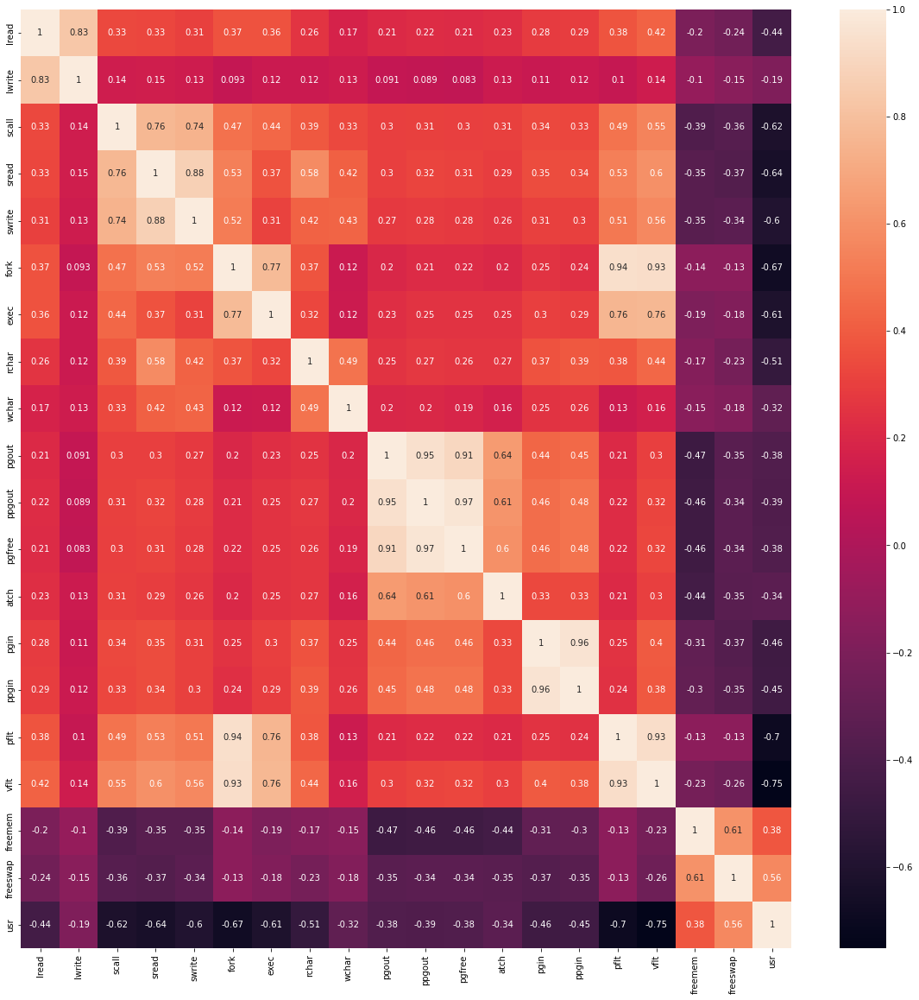

In [34]:
plt.figure(figsize=(20,20))
sns.heatmap(df_corr, annot=True)

In [35]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin', 'pflt',
       'vflt', 'freemem', 'freeswap', 'usr'],
      dtype='object')

### Split Data

In [36]:
# independent variables
X=df[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin', 'pflt',
       'vflt', 'freemem', 'freeswap']]
# dependent variable
y=df['usr']

In [37]:
# let's add the intercept to data
X = sm.add_constant(X)

#### We will now split X and y into train and test sets in a 70:30 ratio.

In [38]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [39]:
print(X_train.head())

      const  lread  lwrite   scall  sread  swrite  fork  exec     rchar  \
694     1.0    1.0     1.0  1345.0  223.0   192.0   0.6   0.6  198703.0   
5535    1.0    1.0     1.0  1429.0   87.0    67.0   0.2   0.2    7163.0   
4244    1.0   47.0    25.0  3273.0  225.0   180.0   0.6   0.4   83246.0   
2472    1.0   13.0     8.0  4349.0  300.0   191.0   2.8   3.0   96009.0   
7052    1.0   17.0    23.0   225.0   13.0    13.0   0.4   1.6   17132.0   

           wchar  pgout  ppgout  pgfree  atch  pgin  ppgin    pflt    vflt  \
694   230625.875   0.60    6.20   12.50   1.5  3.80   7.40   28.20   56.60   
5535   24842.000   0.00    0.00    0.00   0.0  1.60   1.60   15.77   30.74   
4244   53705.000   5.39    7.19    7.19   1.5  3.99   4.59   59.88   74.05   
2472   70467.000   0.00    0.00    0.00   0.0  2.80   3.20  129.00  236.80   
7052   12514.000   0.00    0.00    0.00   0.0  0.00   0.00   19.80   23.80   

      freemem   freeswap  
694     121.0  1375446.0  
5535   1476.0  1021541.0  

In [40]:
print(X_test.head())

      const  lread  lwrite   scall  sread  swrite  fork  exec     rchar  \
3894    1.0   27.0    25.0  1252.0   53.0   118.0   0.2   0.2   26592.0   
4276    1.0    1.0     0.0   996.0   85.0    55.0   0.4   0.4   16667.0   
3414    1.0    9.0     7.0  1530.0  247.0   135.0   0.4   0.4   14513.0   
4165    1.0   32.0     4.0  3243.0  182.0   140.0   4.9   5.6  337517.0   
7385    1.0   16.0     3.0  5017.0  259.0   249.0   2.8   1.4   73537.0   

           wchar  pgout  ppgout  pgfree  atch  pgin  ppgin    pflt    vflt  \
3894   54394.000    0.0     0.0     0.0   0.0   0.4    0.6   19.44   20.04   
4276   36431.000    0.0     0.0     0.0   0.0   1.0    1.4   35.53   52.10   
3414   61905.000    6.0    10.5    12.5   1.5  14.8   18.4   26.80  186.20   
4165   94832.000    0.8     1.0     1.0   1.4   4.6    7.0  250.60  420.20   
7385  230625.875    0.0     0.0     0.0   0.0   5.6    5.8  142.80  276.20   

       freemem   freeswap  
3894  4659.125  1875466.0  
4276  2979.000  1010114.

#### Fit Linear Model

In [41]:
    #fitting the linear model
    fitmod= sm.OLS(y_train,X_train)
    fitres=fitmod.fit()

In [42]:
# let's print the regression summary
print(fitres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1133.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:16   Log-Likelihood:                -16738.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5714   BIC:                         3.365e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5495      0.300    285.117      0.0

### Interpretation of R-squared
####      -The R-squared value tells us that our model can explain 79.0% of the variance in the training set.

In [43]:
# checking the varience inflation factor of the predictors\
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
  [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
  index=X_train.columns,
)
print('VIF values: \n\n{}\n'.format(vif_series1))

VIF values: 

const       25.601099
lread        5.298513
lwrite       4.303179
scall        2.929695
sread        6.420121
swrite       5.597129
fork        13.031712
exec         3.240493
rchar        2.110885
wchar        1.555099
pgout       11.348082
ppgout      29.394226
pgfree      16.486831
atch         1.874624
pgin        13.808466
ppgin       13.947912
pflt        12.001459
vflt        15.970315
freemem      1.945776
freeswap     1.828205
dtype: float64



#### Let's remove/drop multicollinear columns one by one and observe the effect on our predictive model.¶

In [44]:
X_train2 =X_train.drop(["ppgout"],axis=1)
fitmod_1=sm.OLS(y_train, X_train2)
fitres_1=fitmod_1.fit()
print(
    "R-squared:",
    np.round(fitres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_1.rsquared,5),
)

R-squared: 0.79 
Adjusted R-squared: 0.79022


#### Inference : On dropping 'ppgout', adj. R-squared almost remains the same.

In [45]:
X_train3 = X_train.drop(["pgfree"], axis=1)
fitmod_2 = sm.OLS(y_train, X_train3)
fitres_2 = fitmod_2.fit()
print(
    "R-squared:",
    np.round(fitres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_2.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'pgfree', adj. R-squared almost remains the same.

In [46]:
X_train4 = X_train.drop(["vflt"], axis=1)
fitmod_3 = sm.OLS(y_train, X_train4)
fitres_3 = fitmod_3.fit()
print(
    "R-squared:", 
    np.round(fitres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_3.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


#### Inference : On dropping 'vflt', adj. R-squared decresed by 0.001

In [47]:
X_train5 = X_train.drop(["ppgin"], axis=1)
fitmod_4 = sm.OLS(y_train, X_train5)
fitres_4 = fitmod_4.fit()
print(
    "R-squared:", 
    np.round(fitres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_4.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


#### Inference : On dropping 'ppgin', adj. R-squared decresed by 0.001

In [48]:
X_train6 = X_train.drop(["pgin"], axis=1)
fitmod_5 = sm.OLS(y_train, X_train6)
fitres_5 = fitmod_5.fit()
print(
    "R-squared:", 
    np.round(fitres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_5.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'pgin', adj. R-squared almost remains the same.

In [49]:
X_train7 = X_train.drop(["fork"], axis=1)
fitmod_6 = sm.OLS(y_train, X_train7)
fitres_6 = fitmod_6.fit()
print(
    "R-squared:", 
    np.round(fitres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_6.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'fork', adj. R-squared almost remains the same.

In [50]:
X_train8 = X_train.drop(["pflt"], axis=1)
fitmod_7 = sm.OLS(y_train, X_train8)
fitres_7 = fitmod_7.fit()
print(
    "R-squared:", 
    np.round(fitres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_7.rsquared_adj, 3),
)

R-squared: 0.78 
Adjusted R-squared: 0.779


#### Inference : On dropping 'pflt', adj. R-squared decreased by 0.011
####             This sharp decline indicates that 'pflt' is an important predictor and shouldn't be removed.

In [51]:
X_train9 = X_train.drop(["pgout"], axis=1)
fitmod_8 = sm.OLS(y_train, X_train9)
fitres_8 = fitmod_8.fit()
print(
    "R-squared:", 
    np.round(fitres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_8.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


#### Inference : On dropping 'pgout', adj. R-squared decresed by 0.001

In [52]:
X_train10 = X_train.drop(["sread"], axis=1)
fitmod_9 = sm.OLS(y_train, X_train10)
fitres_9 = fitmod_9.fit()
print(
    "R-squared:", 
    np.round(fitres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_8.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


#### Inference : On dropping 'sread', adj. R-squared decresed by 0.001

In [53]:
X_train = X_train.drop(["ppgout"], axis=1)

#### Inference : Since there is no effect on adj. R-squared after dropping the 'ppgout' column, and it has highest number in value of varience influence factor, so we remove it from the training set.

In [54]:
fitmod_10 = sm.OLS(y_train, X_train)
fitres_10 = fitmod_10.fit()
print(fitres_10.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1196.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:17   Log-Likelihood:                -16739.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5715   BIC:                         3.364e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5676      0.299    286.179      0.0

#### Inference : -The R-squared value tells us that our model can explain 79.0% of the variance in the training set.

## Let's check if multicollinearity is still present in the data.

In [55]:
vif_series2 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series2))

VIF values: 

const       25.424423
lread        5.298433
lwrite       4.303148
scall        2.929554
sread        6.420086
swrite       5.597020
fork        13.023854
exec         3.238358
rchar        2.110869
wchar        1.551973
pgout        6.430968
pgfree       6.171219
atch         1.874301
pgin        13.782952
ppgin       13.894353
pflt        12.001459
vflt        15.966065
freemem      1.943526
freeswap     1.825361
dtype: float64



In [56]:
X_train11 = X_train.drop(["vflt"], axis=1)
fitmod_11 = sm.OLS(y_train, X_train11)
fitres_11 = fitmod_11.fit()
print(
    "R-squared:", 
    np.round(fitres_11.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_11.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


#### Inference : On dropping 'vflt', adj. R-squared decresed by 0.001

In [57]:
X_train12 = X_train.drop(["ppgin"], axis=1)
fitmod_12 = sm.OLS(y_train, X_train12)
fitres_12 = fitmod_12.fit()
print(
    "R-squared:", 
    np.round(fitres_12.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_12.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [58]:
X_train13 = X_train.drop(["pgin"], axis=1)
fitmod_13 = sm.OLS(y_train, X_train13)
fitres_13 = fitmod_13.fit()
print(
    "R-squared:", 
    np.round(fitres_13.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_13.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'pgin', adj. R-squared almost remains the same.

In [59]:
X_train14 = X_train.drop(["fork"], axis=1)
fitmod_14 = sm.OLS(y_train, X_train14)
fitres_14 = fitmod_14.fit()
print(
    "R-squared:", 
    np.round(fitres_14.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_14.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'fork', adj. R-squared almost remains the same.

In [60]:
X_train15 = X_train.drop(["pflt"], axis=1)
fitmod_15 = sm.OLS(y_train, X_train15)
fitres_15 = fitmod_15.fit()
print(
    "R-squared:", 
    np.round(fitres_15.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_15.rsquared_adj, 3),
)

R-squared: 0.78 
Adjusted R-squared: 0.779


#### Inference : On dropping 'pflt', adj. R-squared decreased by 0.011
####                    This sharp decline indicates that 'pflt' is an important predictor and shouldn't be removed.

In [61]:
X_train16 = X_train.drop(["sread"], axis=1)
fitmod_16 = sm.OLS(y_train, X_train16)
fitres_16 = fitmod_16.fit()
print(
    "R-squared:", 
    np.round(fitres_16.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_16.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'sread', adj. R-squared almost remains the same.

In [62]:
X_train17 = X_train.drop(["sread"], axis=1)
fitmod_17 = sm.OLS(y_train, X_train17)
fitres_17 = fitmod_17.fit()
print(
    "R-squared:", 
    np.round(fitres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_17.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [63]:
X_train = X_train.drop(["pgin"], axis=1)

#### Inference : Since there is no effect on adj. R-squared after dropping the 'pgin' column, and it has highest number in value of varience influence factor, so we remove it from the training set.

In [64]:
fitmod_18 = sm.OLS(y_train, X_train)
fitres_18 = fitmod_18.fit()
print(fitres_18.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1266.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:17   Log-Likelihood:                -16739.
No. Observations:                5734   AIC:                         3.351e+04
Df Residuals:                    5716   BIC:                         3.363e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5825      0.298    287.156      0.0

#### Inference : -The R-squared value tells us that our model can explain 79.0% of the variance in the training set.

## Let's check if multicollinearity is still present in the data.

In [65]:
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series3))

VIF values: 

const       25.263079
lread        5.295815
lwrite       4.303110
scall        2.927766
sread        6.418812
swrite       5.596559
fork        13.008265
exec         3.235774
rchar        2.099560
wchar        1.550961
pgout        6.422354
pgfree       6.155198
atch         1.874263
ppgin        1.722709
pflt        11.952041
vflt        15.755601
freemem      1.943522
freeswap     1.817817
dtype: float64



### Let's remove/drop multicollinear columns one by one and observe the effect on our predictive model.

In [66]:
X_train18 = X_train.drop(["vflt"], axis=1)
fitmod_19 = sm.OLS(y_train, X_train18)
fitres_19 = fitmod_19.fit()
print(
    "R-squared:", 
    np.round(fitres_19.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_19.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


#### Inference : On dropping 'vflt', adj. R-squared decresed by 0.001

In [67]:
X_train19 = X_train.drop(["fork"], axis=1)
fitmod_20 = sm.OLS(y_train, X_train19)
fitres_20 = fitmod_20.fit()
print(
    "R-squared:", 
    np.round(fitres_20.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_20.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'fork', adj. R-squared almost remains the same.

In [68]:
X_train20 = X_train.drop(["pflt"], axis=1)
fitmod_21 = sm.OLS(y_train, X_train20)
fitres_21 = fitmod_21.fit()
print(
    "R-squared:", 
    np.round(fitres_21.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_21.rsquared_adj, 3),
)

R-squared: 0.78 
Adjusted R-squared: 0.779


#### Inference : On dropping 'pflt', adj. R-squared decreased by 0.011

In [69]:
X_train21 = X_train.drop(["sread"], axis=1)
fitmod_22 = sm.OLS(y_train, X_train21)
fitres_22 = fitmod_22.fit()
print(
    "R-squared:", 
    np.round(fitres_22.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_22.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


#### Inference : On dropping 'sread', adj. R-squared almost remains the same.

In [70]:
X_train = X_train.drop(["fork"], axis=1)

In [71]:
fitmod_23 = sm.OLS(y_train, X_train)
fitres_23 = fitmod_23.fit()
print(fitres_23.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1346.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:18   Log-Likelihood:                -16739.
No. Observations:                5734   AIC:                         3.351e+04
Df Residuals:                    5717   BIC:                         3.363e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5665      0.296    289.400      0.0

## Let's check if multicollinearity is still present in the data.

In [72]:
vif_series4 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

VIF values: 

const       24.867190
lread        5.291314
lwrite       4.292316
scall        2.881265
sread        6.401983
swrite       5.424154
exec         2.976082
rchar        2.099430
wchar        1.550783
pgout        6.422127
pgfree       6.153589
atch         1.868078
ppgin        1.662799
pflt        10.263511
vflt        12.208194
freemem      1.943497
freeswap     1.794067
dtype: float64



In [73]:
X_train22 = X_train.drop(["vflt"], axis=1)
fitmod_24 = sm.OLS(y_train, X_train21)
fitres_24 = fitmod_24.fit()
print(
    "R-squared:", 
    np.round(fitres_24.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_24.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [74]:
X_train23 = X_train.drop(["pflt"], axis=1)
fitmod_25 = sm.OLS(y_train, X_train23)
fitres_25 = fitmod_25.fit()
print(
    "R-squared:", 
    np.round(fitres_25.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_25.rsquared_adj, 3),
)

R-squared: 0.778 
Adjusted R-squared: 0.778


In [75]:
X_train24 = X_train.drop(["pgout"], axis=1)
fitmod_26 = sm.OLS(y_train, X_train24)
fitres_26 = fitmod_26.fit()
print(
    "R-squared:", 
    np.round(fitres_26.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_26.rsquared_adj, 3),
)

R-squared: 0.789 
Adjusted R-squared: 0.789


In [76]:
X_train25 = X_train.drop(["sread"], axis=1)
fitmod_27 = sm.OLS(y_train, X_train25)
fitres_27 = fitmod_27.fit()
print(
    "R-squared:", 
    np.round(fitres_27.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_27.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [77]:
X_train26 = X_train.drop(["pgfree"], axis=1)
fitmod_28 = sm.OLS(y_train, X_train26)
fitres_28 = fitmod_28.fit()
print(
    "R-squared:", 
    np.round(fitres_28.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_28.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [78]:
X_train27 = X_train.drop(["swrite"], axis=1)
fitmod_30 = sm.OLS(y_train, X_train27)
fitres_30 = fitmod_30.fit()
print(
    "R-squared:", 
    np.round(fitres_30.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_30.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [79]:
X_train28 = X_train.drop(["lread"], axis=1)
fitmod_31 = sm.OLS(y_train, X_train28)
fitres_31 = fitmod_31.fit()
print(
    "R-squared:", 
    np.round(fitres_31.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_31.rsquared_adj, 3),
)

R-squared: 0.788 
Adjusted R-squared: 0.787


In [80]:
X_train = X_train.drop(["vflt"], axis=1)

In [81]:
fitmod_32 = sm.OLS(y_train, X_train)
fitres_32 = fitmod_32.fit()
print(fitres_32.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1431.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:18   Log-Likelihood:                -16747.
No. Observations:                5734   AIC:                         3.353e+04
Df Residuals:                    5718   BIC:                         3.363e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4656      0.295    289.795      0.0

## Let's check if multicollinearity is still present in the data.

In [82]:
vif_series5 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series5))

VIF values: 

const       24.678799
lread        5.263308
lwrite       4.283585
scall        2.881082
sread        6.373377
swrite       5.389479
exec         2.852210
rchar        2.090954
wchar        1.520539
pgout        6.420218
pgfree       6.134764
atch         1.861635
ppgin        1.557223
pflt         3.458759
freemem      1.941502
freeswap     1.759406
dtype: float64



In [83]:
X_train29 = X_train.drop(["pgout"], axis=1)
fitmod_33 = sm.OLS(y_train, X_train29)
fitres_33 = fitmod_33.fit()
print(
    "R-squared:", 
    np.round(fitres_33.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_33.rsquared_adj, 3),
)

R-squared: 0.789 
Adjusted R-squared: 0.788


In [84]:
X_train30 = X_train.drop(["sread"], axis=1)
fitmod_34 = sm.OLS(y_train, X_train30)
fitres_34 = fitmod_34.fit()
print(
    "R-squared:", 
    np.round(fitres_34.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_34.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [85]:
X_train31 = X_train.drop(["pgfree"], axis=1)
fitmod_35 = sm.OLS(y_train, X_train31)
fitres_35 = fitmod_35.fit()
print(
    "R-squared:", 
    np.round(fitres_35.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_35.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [86]:
X_train32 = X_train.drop(["lread"], axis=1)
fitmod_36 = sm.OLS(y_train, X_train32)
fitres_36 = fitmod_36.fit()
print(
    "R-squared:", 
    np.round(fitres_36.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_36.rsquared_adj, 3),
)

R-squared: 0.787 
Adjusted R-squared: 0.786


In [87]:
X_train = X_train.drop(["sread"], axis=1)

In [88]:
fitmod_37 = sm.OLS(y_train, X_train)
fitres_37 = fitmod_37.fit()
print(fitres_37.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1533.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:19   Log-Likelihood:                -16747.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5719   BIC:                         3.362e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4651      0.294    290.228      0.0

## Let's check if multicollinearity is still present in the data.

In [89]:
vif_series6 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series6))

VIF values: 

const       24.609318
lread        5.256025
lwrite       4.274448
scall        2.623304
swrite       3.013628
exec         2.845389
rchar        1.672692
wchar        1.507355
pgout        6.419560
pgfree       6.134003
atch         1.860335
ppgin        1.556204
pflt         3.437037
freemem      1.940946
freeswap     1.745925
dtype: float64



In [90]:
X_train33 = X_train.drop(["pgout"], axis=1)
fitmod_38 = sm.OLS(y_train, X_train33)
fitres_38 = fitmod_38.fit()
print(
    "R-squared:", 
    np.round(fitres_38.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_38.rsquared_adj, 3),
)

R-squared: 0.789 
Adjusted R-squared: 0.788


In [91]:
X_train34 = X_train.drop(["pgfree"], axis=1)
fitmod_39 = sm.OLS(y_train, X_train34)
fitres_39 = fitmod_39.fit()
print(
    "R-squared:", 
    np.round(fitres_39.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_39.rsquared_adj, 3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [92]:
X_train35 = X_train.drop(["lread"], axis=1)
fitmod_40 = sm.OLS(y_train, X_train35)
fitres_40 = fitmod_40.fit()
print(
    "R-squared:", 
    np.round(fitres_40.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_40.rsquared_adj, 3),
)

R-squared: 0.787 
Adjusted R-squared: 0.786


In [93]:
X_train = X_train.drop(["pgfree"], axis=1)

In [94]:
fitmod_41 = sm.OLS(y_train, X_train)
fitres_41 = fitmod_41.fit()
print(fitres_41.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     1651.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:19   Log-Likelihood:                -16747.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5720   BIC:                         3.362e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4634      0.294    290.217      0.0

## Let's check if multicollinearity is still present in the data.

In [95]:
vif_series7 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series7))

VIF values: 

const       24.608667
lread        5.252482
lwrite       4.269747
scall        2.620463
swrite       3.012179
exec         2.842593
rchar        1.672474
wchar        1.507075
pgout        2.031280
atch         1.859242
ppgin        1.517295
pflt         3.437026
freemem      1.929513
freeswap     1.744428
dtype: float64



### Inference: In our data multicolinearity is still present. So we should drop the 'lread' column to get the accuracy.

In [96]:
X_train = X_train.drop(["lread"], axis=1)

In [97]:
vif_series8 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series8))

VIF values: 

const       24.607003
lwrite       1.051904
scall        2.610927
swrite       3.011508
exec         2.813506
rchar        1.672303
wchar        1.505525
pgout        2.031070
atch         1.858779
ppgin        1.465832
pflt         3.255423
freemem      1.928669
freeswap     1.739738
dtype: float64



In [98]:
X_train = X_train.drop(["pflt"], axis=1)

In [99]:
fitmod_42 = sm.OLS(y_train, X_train35)
fitres_42 = fitmod_42.fit()
print(fitres_42.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                     1625.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:09:19   Log-Likelihood:                -16783.
No. Observations:                5734   AIC:                         3.359e+04
Df Residuals:                    5720   BIC:                         3.369e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4441      0.296    288.345      0.0

### Inference : After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply. This shows that these variables did not have much predictive power.

In [100]:
vif_series9 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series9))

VIF values: 

const       24.318585
lwrite       1.051894
scall        2.601101
swrite       2.521669
exec         1.368012
rchar        1.623734
wchar        1.438804
pgout        2.027035
atch         1.858638
ppgin        1.463216
freemem      1.911325
freeswap     1.727889
dtype: float64



### Inference : VIF for all features is <3

In [101]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train.values.flatten()  # actual values
df_pred["Fitted Values"] = fitres_42.fittedvalues.values  # predicted values
df_pred["Residuals"] = fitres_42.resid.values  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
0,91.0,91.765169,-0.765169
1,94.0,91.261125,2.738875
2,61.5,76.430666,-14.930666
3,83.0,81.272261,1.727739
4,94.0,97.101512,-3.101512


### TEST FOR LINEARITY AND INDEPENDENCE

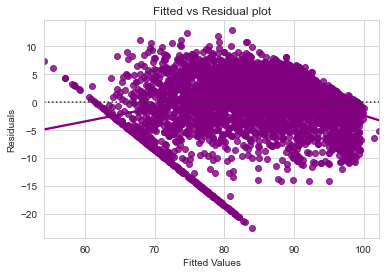

In [102]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

#### Inference : We observe that the pattern has slightly decreased and the data points seems to be randomly distributed.

In [103]:
# columns in training set
X_train35.columns

Index(['const', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'pgfree', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap'],
      dtype='object')

<Figure size 720x720 with 0 Axes>

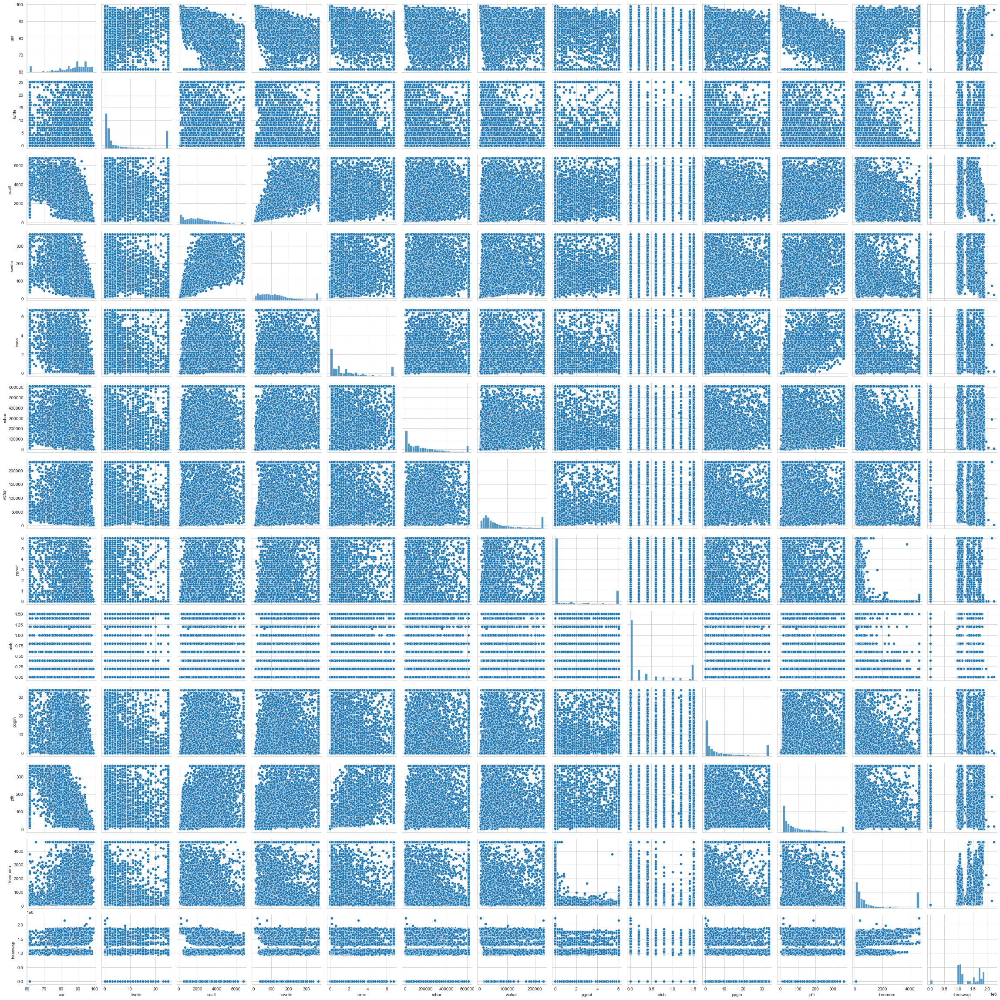

In [104]:
# checking the distribution of variables in training set with dependent variable
plt.figure(figsize=(10,10))
sns.pairplot(df[['usr', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'atch', 'ppgin', 'pflt', 'freemem', 'freeswap']])
plt.show()

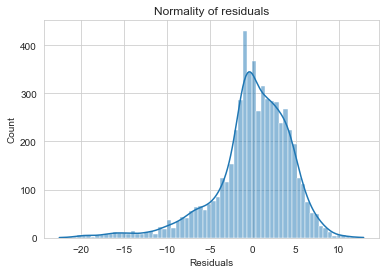

In [105]:
sns.histplot(df_pred["Residuals"], kde=True)
plt.title("Normality of residuals")
plt.show()

#### Inference : The residual terms are normally distributed.

####  The QQ plot of residuals can be used to visually check the normality assumption. The normal probability plot of residuals should approximately follow a straight line.

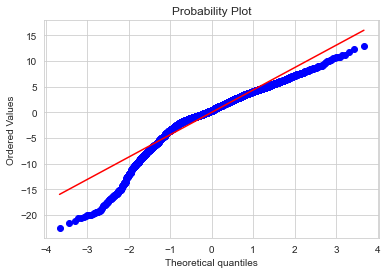

In [106]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

#### Inference : Partially the points are lying on the straight line in QQ plot

In [107]:
stats.shapiro(df_pred["Residuals"])

C:\Users\deepak\anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9300408959388733, pvalue=1.401298464324817e-45)

#### Inference : when p-value is  < 0.05, the residuals are rejected in shapiro test. but the tested value is greater than 0.05


### TEST FOR HOMOSCEDASTICITY

In [108]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [109]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], X_train8)
lzip(name, test)

[('F statistic', 1.129992345971364), ('p-value', 0.0005576651863865903)]

#### Inference : All the assumptions of linear regression are now satisfied. Let's check the summary of our final model (fitres_42).

In [110]:
print(fitres_42.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                     1625.
Date:                Wed, 16 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:10:06   Log-Likelihood:                -16783.
No. Observations:                5734   AIC:                         3.359e+04
Df Residuals:                    5720   BIC:                         3.369e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.4441      0.296    288.345      0.0

### Let's print the linear regression equation.

In [111]:
# let's check the model parameters
fitres_42.params

const       85.444051
lwrite      -0.035432
scall       -0.000779
swrite      -0.005936
exec        -0.408362
rchar       -0.000006
wchar       -0.000006
pgout       -0.352144
pgfree       0.027503
atch         0.621658
ppgin       -0.069885
pflt        -0.041413
freemem     -0.000400
freeswap     0.000009
dtype: float64

In [112]:
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train35.columns)):
    if i == 0:
        print(fitres_42.params[i], "+", end=" ")
    elif i != len(X_train35.columns) - 1:
        print(
            fitres_42.params[i],
            "* (",
            X_train35.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(fitres_42.params[i], "* (", X_train35.columns[i], ")")

usr = 85.44405142467511 + -0.035431681356885014 * ( lwrite ) +  -0.0007789166996721053 * ( scall ) +  -0.005936423812741981 * ( swrite ) +  -0.4083621002816187 * ( exec ) +  -6.000393832811584e-06 * ( rchar ) +  -6.3764108150063345e-06 * ( wchar ) +  -0.35214422917290333 * ( pgout ) +  0.027503334107573052 * ( pgfree ) +  0.6216576279549768 * ( atch ) +  -0.06988532485141428 * ( ppgin ) +  -0.041412582605310805 * ( pflt ) +  -0.00040001855732442785 * ( freemem ) +  8.811877093352114e-06 * ( freeswap )


## We can now use the model for making predictions on the test data.

In [113]:
X_train35.columns

Index(['const', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'pgfree', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap'],
      dtype='object')

In [114]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap'],
      dtype='object')

In [115]:
# dropping columns from the test data that are not there in the training data
X_test2 = X_test.drop(
    ["lread", "sread", "fork","ppgout","pgfree","pgin","vflt"], axis=1
)

In [121]:
# let's make predictions on the test set
y_pred = fitres_42.predict(X_test2)

ValueError: shapes (2458,13) and (14,) not aligned: 13 (dim 1) != 14 (dim 0)

In [118]:
# let's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(y_train, df_pred["Fitted Values"]))
rmse1

4.5178654445402175

In [119]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred))
rmse2

NameError: name 'y_pred' is not defined

In [120]:
# let's check the MAE on the train data
mae1 = mean_absolute_error(y_train, df_pred["Fitted Values"])
mae1

3.2815528468363233

In [ ]:
# let's check the MAE on the test data
mae2 = mean_absolute_error(y_test, y_pred)
mae2

#### Inference : We can see that RMSE on the train and test sets are comparable. So, our model is not suffering from overfitting.
####                    MAE indicates that our current model is able to predict mpg within a mean error of 3.4 units on the test data.
####                    Hence, we can conclude the model "fitres_42" is good for prediction as well as inference purposes.